In [9]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor
import pandas as pd

In [10]:
train_labels_file = 'train_labels.csv'
train_images_dir = 'data/train'

data = pd.read_csv(train_labels_file)
data.head()


,dataset,scene,image,rotation_matrix,translation_vector
0,imc2023_haiper,fountain,fountain_image_116.png,0.122655949;0.947713775;-0.294608417;0.1226706...,0.093771314;-0.803560988;2.062001533
1,imc2023_haiper,fountain,fountain_image_108.png,0.474305910;0.359108654;-0.803787832;0.2888416...,0.358946647;-0.797557548;1.910906929
2,imc2023_haiper,fountain,fountain_image_101.png,0.565115476;-0.138485064;-0.813305838;0.506678...,0.146922468;-0.981392596;2.009002852
3,imc2023_haiper,fountain,fountain_image_082.png,-0.308320392;-0.794654112;0.522937261;0.948141...,0.206413831;-1.174321103;3.667167680
4,imc2023_haiper,fountain,fountain_image_071.png,-0.569002830;-0.103808175;0.815757098;0.778745...,-0.015140892;-1.334052012;3.488936597


In [11]:
dataset_in_train_labels = list(data['dataset'].unique())  # Check unique values in the 'dataset' column
import os
dataset_in_data_train = os.listdir(train_images_dir)  # List items in the directory

dataset_in_train_labels.sort() == dataset_in_data_train.sort()  # Sort both lists for comparison
# Check if the two lists are equal


True

##### i wanted  to be sure that each dataset in my train_labels_file has a corresponding folder in the train_images_dir

In [12]:
#class CustomDataset(Dataset):
#     def __init__(self, labels_file, images_dir, transform=None):
#         self.labels_df = pd.read_csv(labels_file)
#         self.images_dir = images_dir
#         self.transform = transform

#     def __len__(self):
#         return len(self.labels_df)

#     def __getitem__(self, idx):
#         img_name = f"{self.images_dir}/{self.labels_df.iloc[idx, 0]}"
#         image = ToTensor()(img_name)  # Placeholder for actual image loading
#         label = self.labels_df.iloc[idx, 1]
        
#         if self.transform:
#             image = self.transform(image)

#         return image, label

In [13]:
list(data['scene'].unique())

['fountain',
 'bike',
 'chairs',
 'outliers',
 'dioscuri',
 'cyprus',
 'wall',
 'church',
 'kyiv-puppet-theater',
 'baalshamin',
 'lizard',
 'pond',
 'british_museum',
 'buckingham_palace',
 'brandenburg_gate',
 'piazza_san_marco',
 'grand_place_brussels',
 'trevi_fountain',
 'sacre_coeur',
 'taj_mahal',
 'st_pauls_cathedral',
 'st_peters_square',
 'peach',
 'vineyard_split_2',
 'vineyard_split_3',
 'vineyard_split_1',
 'ET',
 'another_ET',
 'stairs_split_1',
 'stairs_split_2']

In [14]:
data['scene'].value_counts()  # Count occurrences of each unique value in the 'scene' column

scene
peach                   200
dioscuri                140
outliers                122
grand_place_brussels    100
st_peters_square        100
st_pauls_cathedral      100
lizard                   90
pond                     90
vineyard_split_3         85
british_museum           75
taj_mahal                75
sacre_coeur              75
trevi_fountain           75
buckingham_palace        75
brandenburg_gate         75
piazza_san_marco         68
church                   50
baalshamin               49
vineyard_split_1         43
wall                     43
vineyard_split_2         35
cyprus                   30
stairs_split_1           28
kyiv-puppet-theater      26
fountain                 23
stairs_split_2           23
chairs                   16
bike                     15
another_ET               10
ET                        9
Name: count, dtype: int64

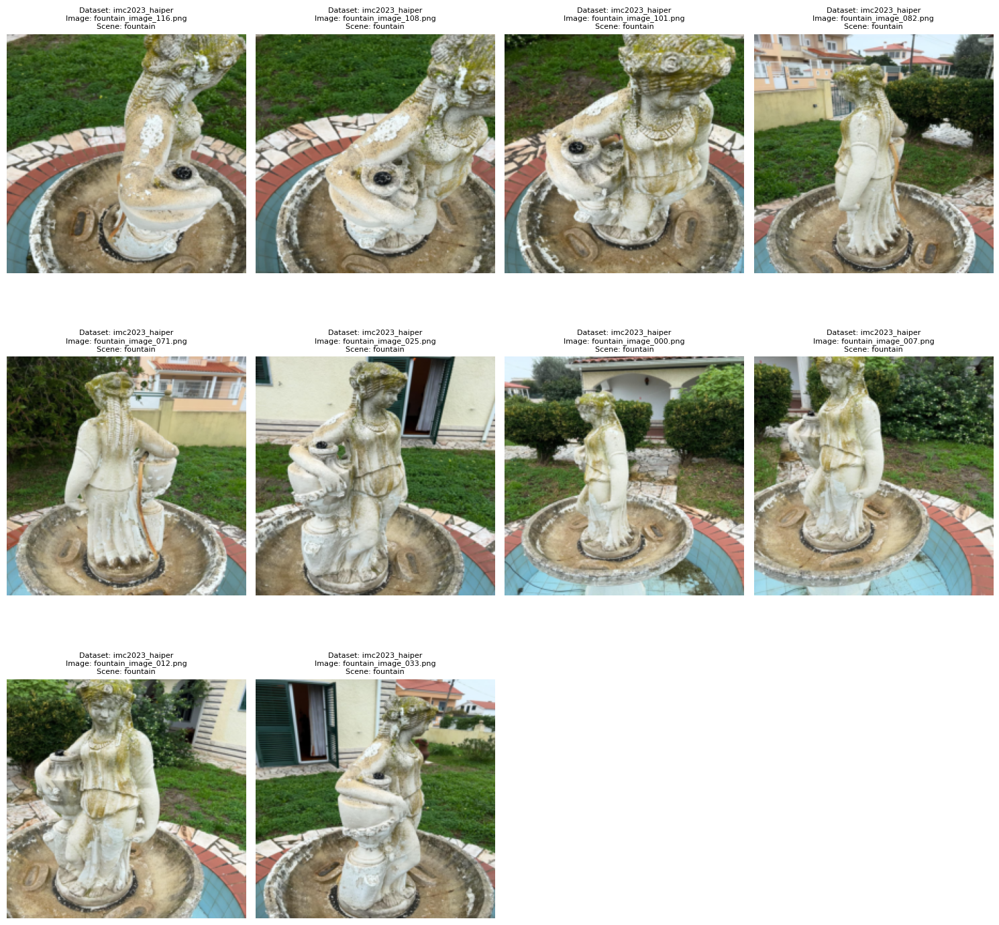

In [15]:
from gettext import translation
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
from torchvision import transforms

class ImageMatchingDataset(Dataset):
    def __init__(self, labels_file, images_dir, transform=None):
        self.labels_df = pd.read_csv(labels_file)
        self.images_dir = images_dir
        self.transform = transform or transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
        ])
        
    def __len__(self):
        return len(self.labels_df)
    
    def __getitem__(self, idx):
        row = self.labels_df.iloc[idx]
        dataset_name = row['dataset']
        scene_name = row['scene']
        image_name = row['image']  # Using the image column
        rotation_matrix = row['rotation_matrix']  # Placeholder for rotation matrix
        translation_vector = row['translation_vector']  # Placeholder for translation vector
        
        # Construct the full image path
        image_path = os.path.join(self.images_dir, dataset_name, image_name)
        
        try:
            image = Image.open(image_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image, dataset_name, image_name ,scene_name ,rotation_matrix, translation_vector
        except Exception as e:
            print(f"Error loading image {image_path}: {str(e)}")
            return None

# Function to display images
def show_batch(dataset, num_images=16, cols=4):
    valid_images = []
    idx = 0
    
    # Collect valid images
    while len(valid_images) < num_images and idx < len(dataset):
        data = dataset[idx]
        if data is not None:
            valid_images.append(data)
        idx += 1
    
    if not valid_images:
        print("No valid images found to display")
        return
    
    # Display valid images
    plt.figure(figsize=(15, 15))
    for i, (image, dataset_name, image_name ,scene_name ,rotation_matrix ,translation_vector) in enumerate(valid_images):
        plt.subplot(num_images//cols + 1, cols, i + 1)
        img_display = image.permute(1, 2, 0).clip(0, 1)  # Convert to HWC and clip values
        plt.imshow(img_display)
        plt.title(f"Dataset: {dataset_name}\nImage: {image_name}\nScene: {scene_name}", fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Create and test the dataset
dataset = ImageMatchingDataset(
    labels_file='train_labels.csv',
    images_dir='data/train'
)

# Display a sample of images
show_batch(dataset, num_images=10, cols=4)

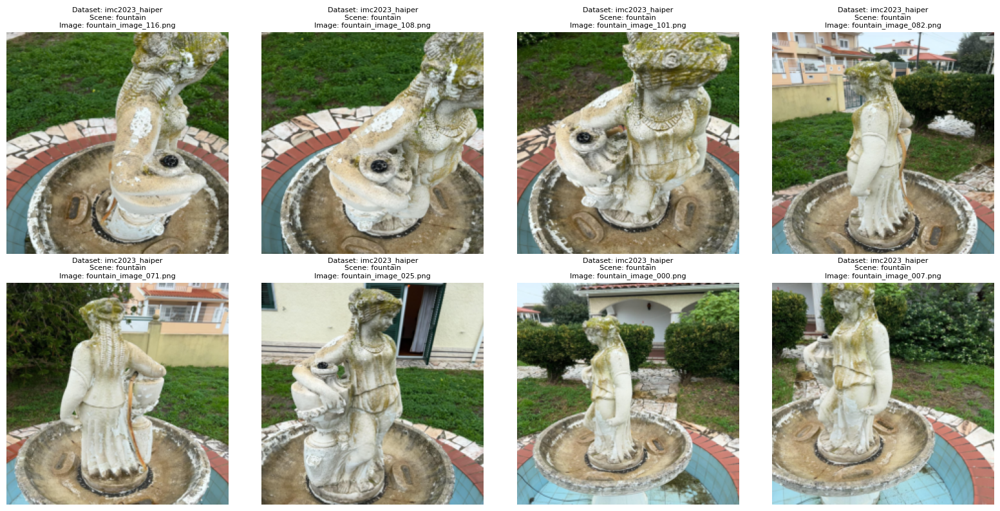

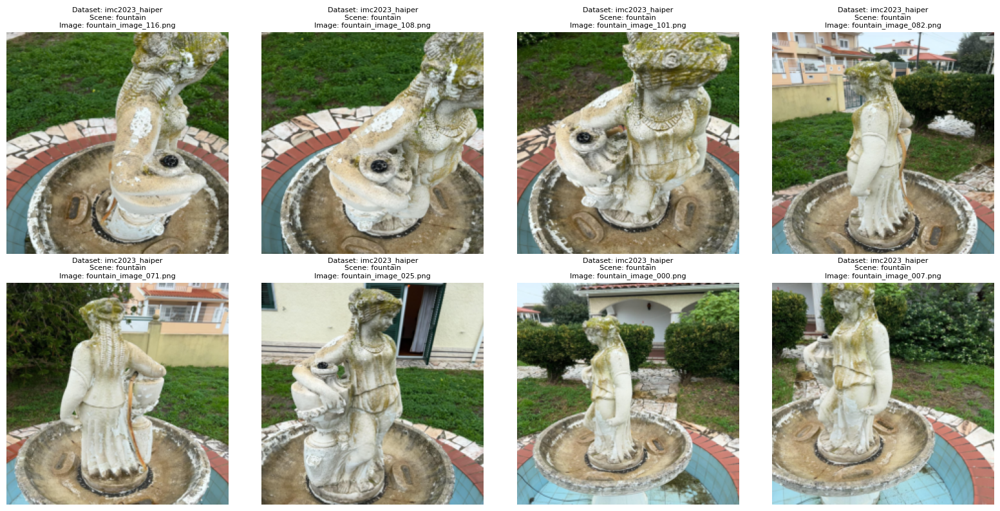

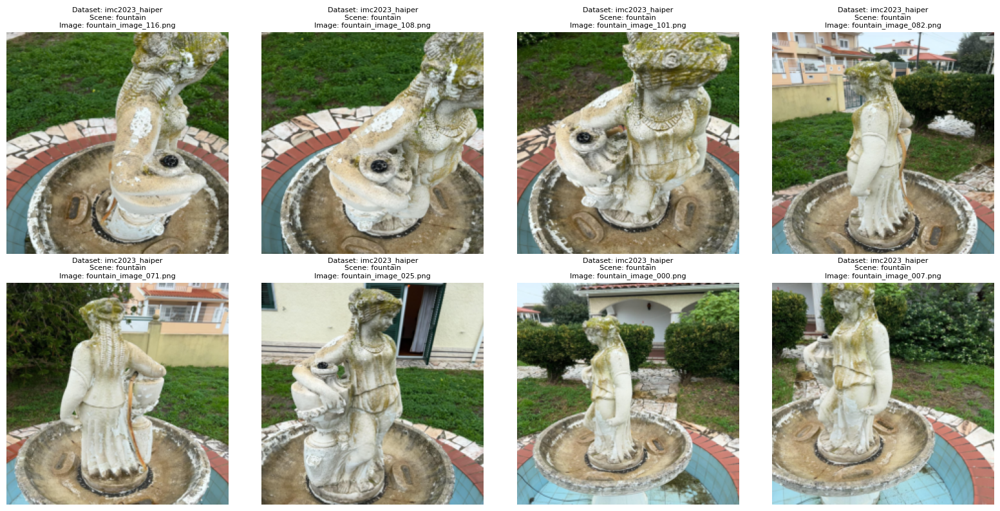

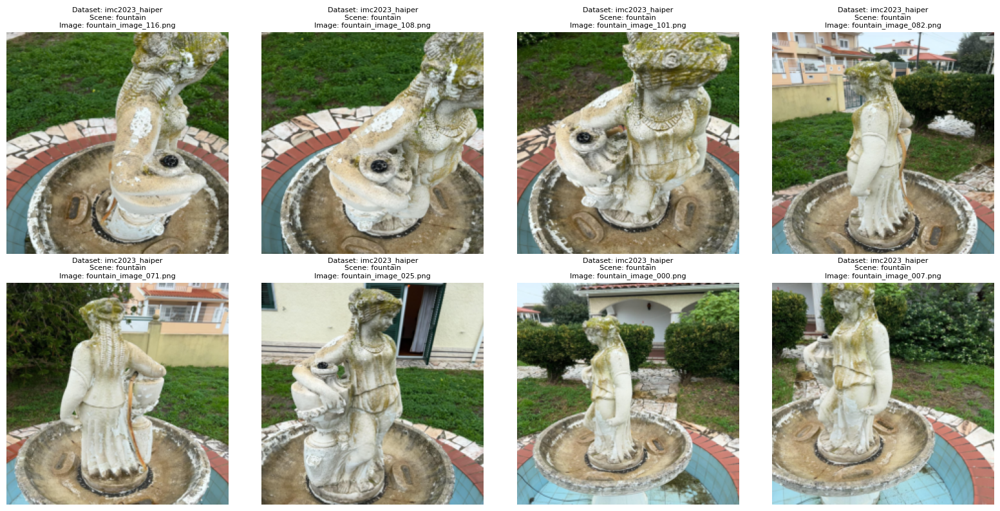


Available datasets:
['imc2023_haiper' 'imc2023_heritage' 'imc2023_theather_imc2024_church'
 'imc2024_dioscuri_baalshamin' 'imc2024_lizard_pond'
 'pt_brandenburg_british_buckingham' 'pt_piazzasanmarco_grandplace'
 'pt_sacrecoeur_trevi_tajmahal' 'pt_stpeters_stpauls' 'amy_gardens'
 'fbk_vineyard' 'ETs' 'stairs']

Available scenes:
['fountain' 'bike' 'chairs' 'outliers' 'dioscuri' 'cyprus' 'wall' 'church'
 'kyiv-puppet-theater' 'baalshamin' 'lizard' 'pond' 'british_museum'
 'buckingham_palace' 'brandenburg_gate' 'piazza_san_marco'
 'grand_place_brussels' 'trevi_fountain' 'sacre_coeur' 'taj_mahal'
 'st_pauls_cathedral' 'st_peters_square' 'peach' 'vineyard_split_2'
 'vineyard_split_3' 'vineyard_split_1' 'ET' 'another_ET' 'stairs_split_1'
 'stairs_split_2']


In [16]:
def show_specific_images(dataset, dataset_name=None, scene_name=None, num_images=8, cols=4):
    """
    Display images from a specific dataset and/or scene
    Args:
        dataset: ImageMatchingDataset object
        dataset_name: Name of the dataset to filter (optional)
        scene_name: Name of the scene to filter (optional)
        num_images: Number of images to display
        cols: Number of columns in the display grid
    """
    # Filter images based on criteria
    valid_images = []
    for idx in range(len(dataset)):
        data = dataset[idx]
        if data is None:
            continue
            
        image, curr_dataset, image_name, curr_scene ,rotation_matrix, translation_vector = data
        
        # Apply filters
        if dataset_name and curr_dataset != dataset_name:
            continue
        if scene_name and curr_scene != scene_name:
            continue
            
        valid_images.append(data)
        if len(valid_images) >= num_images:
            break
    
    if not valid_images:
        print(f"No images found for dataset: {dataset_name}, scene: {scene_name}")
        return
    
    # Display valid images
    rows = (len(valid_images) + cols - 1) // cols
    plt.figure(figsize=(4*cols, 4*rows))
    
    for i, (image, curr_dataset, image_name, curr_scene ,rotation_matrix, translation_vector) in enumerate(valid_images):
        plt.subplot(rows, cols, i + 1)
        img_display = image.permute(1, 2, 0).clip(0, 1)
        plt.imshow(img_display)
        plt.title(f"Dataset: {curr_dataset}\nScene: {curr_scene}\nImage: {image_name}", fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Create dataset
dataset = ImageMatchingDataset(
    labels_file='train_labels.csv',
    images_dir='data/train'
)

# Example usage:

# 1. Show images from a specific dataset
show_specific_images(dataset, dataset_name='imc2023_haiper', num_images=8)

# 2. Show images from a specific scene
show_specific_images(dataset, scene_name='fountain', num_images=8)

# 3. Show images from a specific dataset and scene
show_specific_images(dataset, dataset_name='imc2023_haiper', scene_name='fountain', num_images=8)

# 4. Show all images (no filters)
show_specific_images(dataset, num_images=8)

# Print available datasets and scenes
print("\nAvailable datasets:")
print(dataset.labels_df['dataset'].unique())
print("\nAvailable scenes:")
print(dataset.labels_df['scene'].unique())

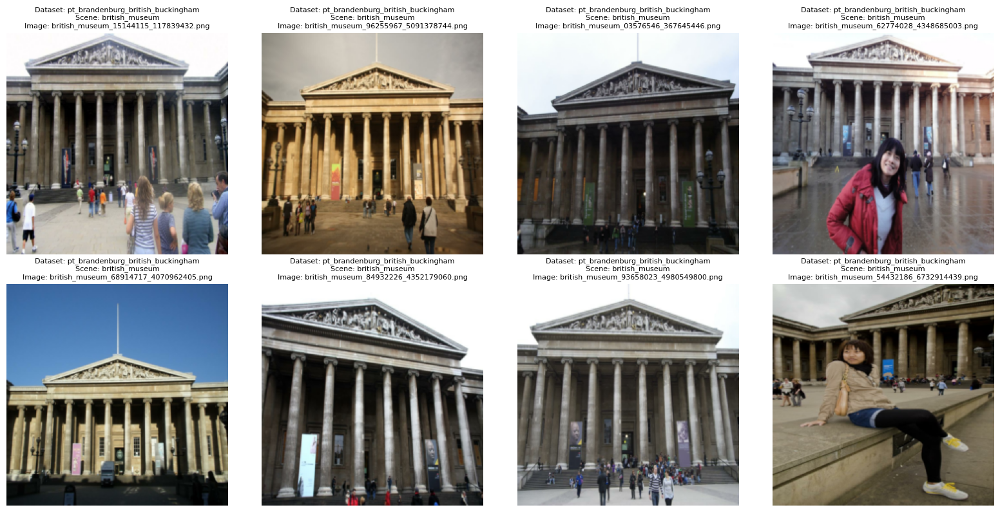

In [17]:
show_specific_images(dataset, dataset_name='pt_brandenburg_british_buckingham', num_images=8)